# Inital Analysis - Unsupervised Learning

### Set Up

In [453]:
import os
import pandas as pd
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import plotly.express as px

In [10]:
os.listdir()

['InstLevel.sas7bdat',
 'InstLevel.sav',
 'instLevel.xlsx',
 'InstlevelDataDoc2017.doc',
 'schools.sas7bdat',
 'schools.sav',
 'Schools.xlsx',
 'SchoolsDoc2017.doc']

In [8]:
os.chdir('EADA_2016-2017')

### EDA

In [20]:
schools = pd.read_excel('Schools.xlsx')

In [21]:
schools.head()

,unitid,institution_name,addr1_txt,addr2_txt,city_txt,state_cd,zip_text,ClassificationCode,classification_name,ClassificationOther,...,EXP_MEN,EXP_WOMEN,TOTAL_EXP_MENWOMEN,EXP_COED_MEN,EXP_COED_WOMEN,TOTAL_EXP_COED,EXPENSE_MENALL,EXPENSE_WOMENALL,TOTAL_EXPENSE_ALL,Sports
0,100654,Alabama A & M University,4900 Meridian Street,NaN,Normal,AL,35762.0,2,NCAA Division I-FCS,NaN,...,516227.0,NaN,516227.0,NaN,NaN,NaN,516227,0,516227,Baseball
1,100654,Alabama A & M University,4900 Meridian Street,NaN,Normal,AL,35762.0,2,NCAA Division I-FCS,NaN,...,824939.0,869729.0,1694668.0,NaN,NaN,NaN,824939,869729,1694668,Basketball
2,100654,Alabama A & M University,4900 Meridian Street,NaN,Normal,AL,35762.0,2,NCAA Division I-FCS,NaN,...,232691.0,366033.0,598724.0,NaN,NaN,NaN,232691,366033,598724,All Track Combined
3,100654,Alabama A & M University,4900 Meridian Street,NaN,Normal,AL,35762.0,2,NCAA Division I-FCS,NaN,...,2996306.0,NaN,2996306.0,NaN,NaN,NaN,2996306,0,2996306,Football
4,100654,Alabama A & M University,4900 Meridian Street,NaN,Normal,AL,35762.0,2,NCAA Division I-FCS,NaN,...,117942.0,NaN,117942.0,NaN,NaN,NaN,117942,0,117942,Golf


In [52]:
schools[schools['institution_name'] == 'University of North Carolina at Chapel Hill']

,unitid,institution_name,addr1_txt,addr2_txt,city_txt,state_cd,zip_text,ClassificationCode,classification_name,ClassificationOther,...,EXP_MEN,EXP_WOMEN,TOTAL_EXP_MENWOMEN,EXP_COED_MEN,EXP_COED_WOMEN,TOTAL_EXP_COED,EXPENSE_MENALL,EXPENSE_WOMENALL,TOTAL_EXPENSE_ALL,Sports
11169,199120,University of North Carolina at Chapel Hill,103 South Bldg Cb 9100,NaN,Chapel Hill,NC,27599.0,1,NCAA Division I-FBS,NaN,...,2063218.0,NaN,2063218.0,NaN,NaN,NaN,2063218,0,2063218,Baseball
11170,199120,University of North Carolina at Chapel Hill,103 South Bldg Cb 9100,NaN,Chapel Hill,NC,27599.0,1,NCAA Division I-FBS,NaN,...,10293415.0,3418621.0,13712036.0,NaN,NaN,NaN,10293415,3418621,13712036,Basketball
11171,199120,University of North Carolina at Chapel Hill,103 South Bldg Cb 9100,NaN,Chapel Hill,NC,27599.0,1,NCAA Division I-FBS,NaN,...,1087019.0,1354955.0,2441974.0,NaN,NaN,NaN,1087019,1354955,2441974,All Track Combined
11172,199120,University of North Carolina at Chapel Hill,103 South Bldg Cb 9100,NaN,Chapel Hill,NC,27599.0,1,NCAA Division I-FBS,NaN,...,172027.0,177527.0,349554.0,NaN,NaN,NaN,172027,177527,349554,Fencing
11173,199120,University of North Carolina at Chapel Hill,103 South Bldg Cb 9100,NaN,Chapel Hill,NC,27599.0,1,NCAA Division I-FBS,NaN,...,NaN,1201713.0,1201713.0,NaN,NaN,NaN,0,1201713,1201713,Field Hockey
11174,199120,University of North Carolina at Chapel Hill,103 South Bldg Cb 9100,NaN,Chapel Hill,NC,27599.0,1,NCAA Division I-FBS,NaN,...,21670847.0,NaN,21670847.0,NaN,NaN,NaN,21670847,0,21670847,Football
11175,199120,University of North Carolina at Chapel Hill,103 South Bldg Cb 9100,NaN,Chapel Hill,NC,27599.0,1,NCAA Division I-FBS,NaN,...,513990.0,574048.0,1088038.0,NaN,NaN,NaN,513990,574048,1088038,Golf
11176,199120,University of North Carolina at Chapel Hill,103 South Bldg Cb 9100,NaN,Chapel Hill,NC,27599.0,1,NCAA Division I-FBS,NaN,...,NaN,891378.0,891378.0,NaN,NaN,NaN,0,891378,891378,Gymnastics
11177,199120,University of North Carolina at Chapel Hill,103 South Bldg Cb 9100,NaN,Chapel Hill,NC,27599.0,1,NCAA Division I-FBS,NaN,...,1238292.0,1222627.0,2460919.0,NaN,NaN,NaN,1238292,1222627,2460919,Lacrosse
11178,199120,University of North Carolina at Chapel Hill,103 South Bldg Cb 9100,NaN,Chapel Hill,NC,27599.0,1,NCAA Division I-FBS,NaN,...,NaN,493659.0,493659.0,NaN,NaN,NaN,0,493659,493659,Rowing


In [319]:
schools.iloc[11169:11173].Sports

11169              Baseball
11170            Basketball
11171    All Track Combined
11172               Fencing
Name: Sports, dtype: object

In [311]:
schools.Sports.unique()

array(['Baseball', 'Basketball', 'All Track Combined', 'Football', 'Golf',
       'Soccer', 'Softball', 'Tennis', 'Volleyball', 'Bowling', 'Rifle',
       'Beach Volleyball', 'Ice Hockey', 'Lacrosse', 'Gymnastics',
       'Rowing', 'Swimming and Diving', 'Track and Field, X-Country',
       'Equestrian', 'Wrestling', 'Track and Field, Indoor',
       'Track and Field, Outdoor', 'Other Sports', 'Rodeo', 'Skiing',
       'Swimming', 'Water Polo', 'Archery', 'Field Hockey', 'Fencing',
       'Sailing', 'Badminton', 'Diving', 'Squash',
       'Synchronized Swimming', 'Weight Lifting', 'Table Tennis'],
      dtype=object)

In [166]:
inst_level = pd.read_excel('instLevel.xlsx')
inst_level.head()

,unitid,institution_name,addr1_txt,addr2_txt,city_txt,state_cd,zip_text,ClassificationCode,classification_name,ClassificationOther,EFMaleCount,EFFemaleCount,EFTotalCount,sector_cd,sector_name,STUDENTAID_MEN,STUDENTAID_WOMEN,STUDENTAID_COED,STUDENTAID_TOTAL,STUAID_MEN_RATIO,STUAID_WOMEN_RATIO,STUAID_COED_RATIO,RECRUITEXP_MEN,RECRUITEXP_WOMEN,RECRUITEXP_COED,RECRUITEXP_TOTAL,HDCOACH_SALARY_MEN,HDCOACH_SALARY_WOMEN,HDCOACH_SALARY_COED,NUM_HDCOACH_MEN,NUM_HDCOACH_WOMEN,NUM_HDCOACH_COED,HDCOACH_SAL_FTE_MEN,HDCOACH_SAL_FTE_WOMN,HDCOACH_SAL_FTE_COED,FTE_HDCOACH_MEN,FTE_HDCOACH_WOMEN,FTE_HDCOACH_COED,ASCOACH_SALARY_MEN,ASCOACH_SALARY_WOMEN,ASCOACH_SALARY_COED,NUM_ASCOACH_MEN,NUM_ASCOACH_WOMEN,NUM_ASCOACH_COED,ASCOACH_SAL_FTE_MEN,ASCOACH_SAL_FTE_WOMN,ASCOACH_SAL_FTE_COED,FTE_ASCOACH_MEN,FTE_ASCOACH_WOMEN,FTE_ASCOACH_COED,IL_PARTIC_MEN,IL_PARTIC_WOMEN,IL_PARTIC_COED_MEN,IL_PARTIC_COED_WOMEN,IL_SUM_PARTIC_MEN,IL_SUM_PARTIC_WOMEN,IL_OPEXPPERPART_MEN,IL_OPEXPPERTEAM_MEN,IL_OPEXPPERPART_WOMEN,IL_OPEXPPERTEAM_WOMEN,IL_TOTAL_OPEXP_MENWOMEN,IL_OPEXPPERPART_COED_MEN,IL_OPEXPPERTEAM_COED_MEN,IL_OPEXP_PART_COED_WOMEN,IL_OPEXP_TEAM_COED_WOMEN,IL_TOTAL_OPEXP_COEDTEAM,IL_SUM_OPEXPPERPART_MEN,IL_SUM_OPEXPPERTEAM_MEN,IL_SUM_OPEXPPERPART_WOMEN,IL_SUM_OPEXPPERTEAM_WOMEN,IL_TOTAL_OPEXP_INCLCOED,IL_MEN_FTHEADCOACH_MALE,IL_MEN_PTHEADCOACH_MALE,IL_MEN_FTUNIVEMPLOY_MALE,IL_MEN_PTUNIVEMPLOY_MALE,IL_MEN_FTHEADCOACH_FEM,IL_MEN_PTHEADCOACH_FEM,IL_MEN_FTUNIVEMPLOY_FEM,IL_MEN_PTUNIVEMPLOY_FEM,IL_MEN_TOTAL_HEADCOACH,IL_WOMEN_FTHDCOACH_MALE,IL_WOMEN_PTHDCOACH_MALE,IL_WOMEN_FTUNIVEMP_MALE,IL_WOMEN_PTUNIVEMP_MALE,IL_WOMEN_FTHDCOACH_FEM,IL_WOMEN_PTHDCOACH_FEM,IL_WOMEN_FTUNIVEMP_FEM,IL_WOMEN_PTUNIVEMP_FEM,IL_WOMEN_TOTAL_HDCOACH,IL_COED_FTHDCOACH_MALE,IL_COED_PTHDCOACH_MALE,IL_COED_FTUNIVEMP_MALE,IL_COED_PTUNIVEMP_MALE,IL_COED_FTHDCOACH_FEM,IL_COED_PTHDCOACH_FEM,IL_COED_FTUNIVEMP_FEM,IL_COED_PTUNIVEMP_FEM,IL_COED_TOTAL_HDCOACH,IL_SUM_FTHDCOACH_MALE,IL_SUM_PTHDCOACH_MALE,IL_SUM_FTUNIVEMP_MALE,IL_SUM_PTUNIVEMP_MALE,IL_SUM_FTHDCOACH_FEM,IL_SUM_PTHDCOACH_FEM,IL_SUM_FTUNIVEMP_FEM,IL_SUM_PTUNIVEMP_FEM,IL_SUM_TOTAL_HDCOACH,IL_MEN_FTASCOACH_MALE,IL_MEN_PTASCOACH_MALE,IL_MEN_FTACUNIVEMP_MALE,IL_MEN_PTACUNIVEMP_MALE,IL_MEN_FTASSTCOACH_FEM,IL_MEN_PTASSTCOACH_FEM,IL_MEN_FTACUNIVEMP_FEM,IL_MEN_PTACUNIVEMP_FEM,IL_MEN_TOTAL_ASSTCOACH,IL_WOMEN_FTASCOACH_MALE,IL_WOMEN_PTASCOACH_MALE,IL_WOMEN_FTACUNEMP_MALE,IL_WOMEN_PTACUNEMP_MALE,IL_WOMEN_FTASTCOACH_FEM,IL_WOMEN_PTASTCOACH_FEM,IL_WOMN_FTACUNIVEMP_FEM,IL_WOMN_PTACUNIVEMP_FEM,IL_WOMEN_TOTAL_ASTCOACH,IL_COED_FTASCOACH_MALE,IL_COED_PTASCOACH_MALE,IL_COED_FTACUNEMP_MALE,IL_COED_PTACUNEMP_MALE,IL_COED_FTASTCOACH_FEM,IL_COED_PTASTCOACH_FEM,IL_COED_FTACUNIVEMP_FEM,IL_COED_PTACUNIVEMP_FEM,IL_COED_TOTAL_ASTCOACH,IL_SUM_FTASCOACH_MALE,IL_SUM_PTASCOACH_MALE,IL_SUM_FTACUNIVEMP_MALE,IL_SUM_PTACUNIVEMP_MALE,IL_SUM_FTASCOACH_FEM,IL_SUM_PTASCOACH_FEM,IL_SUM_FTACUNIVEMP_FEM,IL_SUM_PTACUNIVEMP_FEM,IL_SUM_TOTAL_ASSTCOACH,IL_REV_MEN,IL_REV_WOMEN,IL_TOTAL_REV_MENWOMEN,IL_REV_COED_MEN,IL_REV_COED_WOMEN,IL_TOTAL_REV_COED,IL_REVENUE_MENALL,IL_REVENUE_WOMENALL,IL_TOTAL_REVENUE_ALL,IL_EXP_MEN,IL_EXP_WOMEN,IL_TOTAL_EXP_MENWOMEN,IL_EXP_COED_MEN,IL_EXP_COED_WOMEN,IL_TOTAL_EXP_COED,IL_EXPENSE_MENALL,IL_EXPENSE_WOMENALL,IL_TOTAL_EXPENSE_ALL,UNDUP_CT_PARTIC_MEN,UNDUP_CT_PARTIC_WOMEN,TOT_REVENUE_ALL_NOTALLOC,TOT_EXPENSE_ALL_NOTALLOC,GRND_TOTAL_REVENUE,GRND_TOTAL_EXPENSE
0,100654,Alabama A & M University,4900 Meridian Street,NaN,Normal,AL,35762.0,2,NCAA Division I-FCS,NaN,1801,2410,4211,1,"Public, 4-year or above",2085307.0,1345159.0,NaN,3430466,61,39,0,53279.0,19429.0,NaN,72708,67604.0,39826.0,NaN,6.0,7.0,NaN,95441.0,53101.0,NaN,4.25,5.25,NaN,45223.0,22537.0,NaN,12.0,6.0,NaN,47189.0,30049.0,NaN,11.5,4.50,NaN,226.0,168.0,NaN,NaN,226,168,30920.0,1058206.0,35772.0,571331.0,1629537.0,NaN,NaN,NaN,NaN,NaN,30920,1058206,35772,571331,1629537,3.0,2.0,3.0,2.0,0.0,1.0,1.0,0.0,6.0,1.0,2.0,2.0,1.0,3.0,1.0,4.0,0.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,4,5,3,3,2,5,0,13,11.0,1.0,12.

In [78]:
inst_level.columns[10:20]

Index(['EFMaleCount', 'EFFemaleCount', 'EFTotalCount', 'sector_cd',
       'sector_name', 'STUDENTAID_MEN', 'STUDENTAID_WOMEN', 'STUDENTAID_COED',
       'STUDENTAID_TOTAL', 'STUAID_MEN_RATIO'],
      dtype='object')

In [96]:
#!pip install fasteda

from fasteda import fast_eda

#def fast_eda(df, target=None, correlation=True, pairplot=True, hist_box_plot=True, countplot=True):

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for fasteda: filename=fasteda-1.0.1-py3-none-any.whl size=4740 sha256=ecb9a9e8b0bcfec94d1d57c9a85dde6de1279bd65c68f83de18d54d6940b4da9
  Stored in directory: c:\users\bridg\appdata\local\pip\cache\wheels\25\0a\33\fc68588daa1cc47e586f140b37866a74a9dfc974f762a2d6f5
Successfully built fasteda


DataFrame Head:


,ClassificationCode,EFMaleCount,EFFemaleCount,EFTotalCount,sector_cd,STUDENTAID_MEN,STUDENTAID_WOMEN,STUDENTAID_COED,STUDENTAID_TOTAL,STUAID_MEN_RATIO,STUAID_WOMEN_RATIO,STUAID_COED_RATIO,RECRUITEXP_MEN,RECRUITEXP_WOMEN,RECRUITEXP_COED,RECRUITEXP_TOTAL,HDCOACH_SALARY_MEN,HDCOACH_SALARY_WOMEN,HDCOACH_SALARY_COED,NUM_HDCOACH_MEN,NUM_HDCOACH_WOMEN,NUM_HDCOACH_COED,HDCOACH_SAL_FTE_MEN,HDCOACH_SAL_FTE_WOMN,HDCOACH_SAL_FTE_COED,FTE_HDCOACH_MEN,FTE_HDCOACH_WOMEN,FTE_HDCOACH_COED,ASCOACH_SALARY_MEN,ASCOACH_SALARY_WOMEN,ASCOACH_SALARY_COED,NUM_ASCOACH_MEN,NUM_ASCOACH_WOMEN,NUM_ASCOACH_COED,ASCOACH_SAL_FTE_MEN,ASCOACH_SAL_FTE_WOMN,ASCOACH_SAL_FTE_COED,FTE_ASCOACH_MEN,FTE_ASCOACH_WOMEN,FTE_ASCOACH_COED,IL_PARTIC_MEN,IL_PARTIC_WOMEN,IL_PARTIC_COED_MEN,IL_PARTIC_COED_WOMEN,IL_SUM_PARTIC_MEN,IL_SUM_PARTIC_WOMEN,IL_OPEXPPERPART_MEN,IL_OPEXPPERTEAM_MEN,IL_OPEXPPERPART_WOMEN,IL_OPEXPPERTEAM_WOMEN,IL_TOTAL_OPEXP_MENWOMEN,IL_OPEXPPERPART_COED_MEN,IL_OPEXPPERTEAM_COED_MEN,IL_OPEXP_PART_COED_WOMEN,IL_OPEXP_TEAM_COED_WOMEN,IL_TOTAL_OPEXP_COEDTEAM,IL_SUM_OPEXPPERPART_MEN,IL_SUM_OPEXPPERTEAM_MEN,IL_SUM_OPEXPPERPART_WOMEN,IL_SUM_OPEXPPERTEAM_WOMEN,IL_TOTAL_OPEXP_INCLCOED,IL_MEN_FTHEADCOACH_MALE,IL_MEN_PTHEADCOACH_MALE,IL_MEN_FTUNIVEMPLOY_MALE,IL_MEN_PTUNIVEMPLOY_MALE,IL_MEN_FTHEADCOACH_FEM,IL_MEN_PTHEADCOACH_FEM,IL_MEN_FTUNIVEMPLOY_FEM,IL_MEN_PTUNIVEMPLOY_FEM,IL_MEN_TOTAL_HEADCOACH,IL_WOMEN_FTHDCOACH_MALE,IL_WOMEN_PTHDCOACH_MALE,IL_WOMEN_FTUNIVEMP_MALE,IL_WOMEN_PTUNIVEMP_MALE,IL_WOMEN_FTHDCOACH_FEM,IL_WOMEN_PTHDCOACH_FEM,IL_WOMEN_FTUNIVEMP_FEM,IL_WOMEN_PTUNIVEMP_FEM,IL_WOMEN_TOTAL_HDCOACH,IL_COED_FTHDCOACH_MALE,IL_COED_PTHDCOACH_MALE,IL_COED_FTUNIVEMP_MALE,IL_COED_PTUNIVEMP_MALE,IL_COED_FTHDCOACH_FEM,IL_COED_PTHDCOACH_FEM,IL_COED_FTUNIVEMP_FEM,IL_COED_PTUNIVEMP_FEM,IL_COED_TOTAL_HDCOACH,IL_SUM_FTHDCOACH_MALE,IL_SUM_PTHDCOACH_MALE,IL_SUM_FTUNIVEMP_MALE,IL_SUM_PTUNIVEMP_MALE,IL_SUM_FTHDCOACH_FEM,IL_SUM_PTHDCOACH_FEM,IL_SUM_FTUNIVEMP_FEM,IL_SUM_PTUNIVEMP_FEM,IL_SUM_TOTAL_HDCOACH,IL_MEN_FTASCOACH_MALE,IL_MEN_PTASCOACH_MALE,IL_MEN_FTACUNIVEMP_MALE,IL_MEN_PTACUNIVEMP_MALE,IL_MEN_FTASSTCOACH_FEM,IL_MEN_PTASSTCOACH_FEM,IL_MEN_FTACUNIVEMP_FEM,IL_MEN_PTACUNIVEMP_FEM,IL_MEN_TOTAL_ASSTCOACH,IL_WOMEN_FTASCOACH_MALE,IL_WOMEN_PTASCOACH_MALE,IL_WOMEN_FTACUNEMP_MALE,IL_WOMEN_PTACUNEMP_MALE,IL_WOMEN_FTASTCOACH_FEM,IL_WOMEN_PTASTCOACH_FEM,IL_WOMN_FTACUNIVEMP_FEM,IL_WOMN_PTACUNIVEMP_FEM,IL_WOMEN_TOTAL_ASTCOACH,IL_COED_FTASCOACH_MALE,IL_COED_PTASCOACH_MALE,IL_COED_FTACUNEMP_MALE,IL_COED_PTACUNEMP_MALE,IL_COED_FTASTCOACH_FEM,IL_COED_PTASTCOACH_FEM,IL_COED_FTACUNIVEMP_FEM,IL_COED_PTACUNIVEMP_FEM,IL_COED_TOTAL_ASTCOACH,IL_SUM_FTASCOACH_MALE,IL_SUM_PTASCOACH_MALE,IL_SUM_FTACUNIVEMP_MALE,IL_SUM_PTACUNIVEMP_MALE,IL_SUM_FTASCOACH_FEM,IL_SUM_PTASCOACH_FEM,IL_SUM_FTACUNIVEMP_FEM,IL_SUM_PTACUNIVEMP_FEM,IL_SUM_TOTAL_ASSTCOACH,IL_REV_MEN,IL_REV_WOMEN,IL_TOTAL_REV_MENWOMEN,IL_REV_COED_MEN,IL_REV_COED_WOMEN,IL_TOTAL_REV_COED,IL_REVENUE_MENALL,IL_REVENUE_WOMENALL,IL_TOTAL_REVENUE_ALL,IL_EXP_MEN,IL_EXP_WOMEN,IL_TOTAL_EXP_MENWOMEN,IL_EXP_COED_MEN,IL_EXP_COED_WOMEN,IL_TOTAL_EXP_COED,IL_EXPENSE_MENALL,IL_EXPENSE_WOMENALL,IL_TOTAL_EXPENSE_ALL,UNDUP_CT_PARTIC_MEN,UNDUP_CT_PARTIC_WOMEN,TOT_REVENUE_ALL_NOTALLOC,TOT_EXPENSE_ALL_NOTALLOC,GRND_TOTAL_REVENUE,GRND_TOTAL_EXPENSE
0,2,1801,2410,4211,1,2085307.0,1345159.0,NaN,3430466,61,39,0,53279.0,19429.0,NaN,72708,67604.0,39826.0,NaN,6.0,7.0,NaN,95441.0,53101.0,NaN,4.25,5.25,NaN,45223.0,22537.0,NaN,12.0,6.0,NaN,47189.0,30049.0,NaN,11.5,4.50,NaN,226.0,168.0,NaN,NaN,226,168,30920.0,1058206.0,35772.0,571331.0,1629537.0,NaN,NaN,NaN,NaN,NaN,30920,1058206,35772,571331,1629537,3.0,2.0,3.0,2.0,0.0,1.0,1.0,0.0,6.0,1.0,2.0,2.0,1.0,3.0,1.0,4.0,0.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,4,5,3,3,2,5,0,13,11.0,1.0,12.0,0.0,0.0,0.0,0.0,0.0,12.0,2.0,3.0,5.0,0.0,1.0,2.0,1.0,2.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,4,17,0,1,2,1,2,20,946611.0,1720874.0,2667485.0,NaN,NaN,NaN,946611,1720874,2667485,946611.0,1720874.0,2667485.0,NaN,NaN,NaN,946611,1720874,2667485,

DataFrame Tail:


,ClassificationCode,EFMaleCount,EFFemaleCount,EFTotalCount,sector_cd,STUDENTAID_MEN,STUDENTAID_WOMEN,STUDENTAID_COED,STUDENTAID_TOTAL,STUAID_MEN_RATIO,STUAID_WOMEN_RATIO,STUAID_COED_RATIO,RECRUITEXP_MEN,RECRUITEXP_WOMEN,RECRUITEXP_COED,RECRUITEXP_TOTAL,HDCOACH_SALARY_MEN,HDCOACH_SALARY_WOMEN,HDCOACH_SALARY_COED,NUM_HDCOACH_MEN,NUM_HDCOACH_WOMEN,NUM_HDCOACH_COED,HDCOACH_SAL_FTE_MEN,HDCOACH_SAL_FTE_WOMN,HDCOACH_SAL_FTE_COED,FTE_HDCOACH_MEN,FTE_HDCOACH_WOMEN,FTE_HDCOACH_COED,ASCOACH_SALARY_MEN,ASCOACH_SALARY_WOMEN,ASCOACH_SALARY_COED,NUM_ASCOACH_MEN,NUM_ASCOACH_WOMEN,NUM_ASCOACH_COED,ASCOACH_SAL_FTE_MEN,ASCOACH_SAL_FTE_WOMN,ASCOACH_SAL_FTE_COED,FTE_ASCOACH_MEN,FTE_ASCOACH_WOMEN,FTE_ASCOACH_COED,IL_PARTIC_MEN,IL_PARTIC_WOMEN,IL_PARTIC_COED_MEN,IL_PARTIC_COED_WOMEN,IL_SUM_PARTIC_MEN,IL_SUM_PARTIC_WOMEN,IL_OPEXPPERPART_MEN,IL_OPEXPPERTEAM_MEN,IL_OPEXPPERPART_WOMEN,IL_OPEXPPERTEAM_WOMEN,IL_TOTAL_OPEXP_MENWOMEN,IL_OPEXPPERPART_COED_MEN,IL_OPEXPPERTEAM_COED_MEN,IL_OPEXP_PART_COED_WOMEN,IL_OPEXP_TEAM_COED_WOMEN,IL_TOTAL_OPEXP_COEDTEAM,IL_SUM_OPEXPPERPART_MEN,IL_SUM_OPEXPPERTEAM_MEN,IL_SUM_OPEXPPERPART_WOMEN,IL_SUM_OPEXPPERTEAM_WOMEN,IL_TOTAL_OPEXP_INCLCOED,IL_MEN_FTHEADCOACH_MALE,IL_MEN_PTHEADCOACH_MALE,IL_MEN_FTUNIVEMPLOY_MALE,IL_MEN_PTUNIVEMPLOY_MALE,IL_MEN_FTHEADCOACH_FEM,IL_MEN_PTHEADCOACH_FEM,IL_MEN_FTUNIVEMPLOY_FEM,IL_MEN_PTUNIVEMPLOY_FEM,IL_MEN_TOTAL_HEADCOACH,IL_WOMEN_FTHDCOACH_MALE,IL_WOMEN_PTHDCOACH_MALE,IL_WOMEN_FTUNIVEMP_MALE,IL_WOMEN_PTUNIVEMP_MALE,IL_WOMEN_FTHDCOACH_FEM,IL_WOMEN_PTHDCOACH_FEM,IL_WOMEN_FTUNIVEMP_FEM,IL_WOMEN_PTUNIVEMP_FEM,IL_WOMEN_TOTAL_HDCOACH,IL_COED_FTHDCOACH_MALE,IL_COED_PTHDCOACH_MALE,IL_COED_FTUNIVEMP_MALE,IL_COED_PTUNIVEMP_MALE,IL_COED_FTHDCOACH_FEM,IL_COED_PTHDCOACH_FEM,IL_COED_FTUNIVEMP_FEM,IL_COED_PTUNIVEMP_FEM,IL_COED_TOTAL_HDCOACH,IL_SUM_FTHDCOACH_MALE,IL_SUM_PTHDCOACH_MALE,IL_SUM_FTUNIVEMP_MALE,IL_SUM_PTUNIVEMP_MALE,IL_SUM_FTHDCOACH_FEM,IL_SUM_PTHDCOACH_FEM,IL_SUM_FTUNIVEMP_FEM,IL_SUM_PTUNIVEMP_FEM,IL_SUM_TOTAL_HDCOACH,IL_MEN_FTASCOACH_MALE,IL_MEN_PTASCOACH_MALE,IL_MEN_FTACUNIVEMP_MALE,IL_MEN_PTACUNIVEMP_MALE,IL_MEN_FTASSTCOACH_FEM,IL_MEN_PTASSTCOACH_FEM,IL_MEN_FTACUNIVEMP_FEM,IL_MEN_PTACUNIVEMP_FEM,IL_MEN_TOTAL_ASSTCOACH,IL_WOMEN_FTASCOACH_MALE,IL_WOMEN_PTASCOACH_MALE,IL_WOMEN_FTACUNEMP_MALE,IL_WOMEN_PTACUNEMP_MALE,IL_WOMEN_FTASTCOACH_FEM,IL_WOMEN_PTASTCOACH_FEM,IL_WOMN_FTACUNIVEMP_FEM,IL_WOMN_PTACUNIVEMP_FEM,IL_WOMEN_TOTAL_ASTCOACH,IL_COED_FTASCOACH_MALE,IL_COED_PTASCOACH_MALE,IL_COED_FTACUNEMP_MALE,IL_COED_PTACUNEMP_MALE,IL_COED_FTASTCOACH_FEM,IL_COED_PTASTCOACH_FEM,IL_COED_FTACUNIVEMP_FEM,IL_COED_PTACUNIVEMP_FEM,IL_COED_TOTAL_ASTCOACH,IL_SUM_FTASCOACH_MALE,IL_SUM_PTASCOACH_MALE,IL_SUM_FTACUNIVEMP_MALE,IL_SUM_PTACUNIVEMP_MALE,IL_SUM_FTASCOACH_FEM,IL_SUM_PTASCOACH_FEM,IL_SUM_FTACUNIVEMP_FEM,IL_SUM_PTACUNIVEMP_FEM,IL_SUM_TOTAL_ASSTCOACH,IL_REV_MEN,IL_REV_WOMEN,IL_TOTAL_REV_MENWOMEN,IL_REV_COED_MEN,IL_REV_COED_WOMEN,IL_TOTAL_REV_COED,IL_REVENUE_MENALL,IL_REVENUE_WOMENALL,IL_TOTAL_REVENUE_ALL,IL_EXP_MEN,IL_EXP_WOMEN,IL_TOTAL_EXP_MENWOMEN,IL_EXP_COED_MEN,IL_EXP_COED_WOMEN,IL_TOTAL_EXP_COED,IL_EXPENSE_MENALL,IL_EXPENSE_WOMENALL,IL_TOTAL_EXPENSE_ALL,UNDUP_CT_PARTIC_MEN,UNDUP_CT_PARTIC_WOMEN,TOT_REVENUE_ALL_NOTALLOC,TOT_EXPENSE_ALL_NOTALLOC,GRND_TOTAL_REVENUE,GRND_TOTAL_EXPENSE
2059,17,894,936,1830,4,0.0,0.0,NaN,0,0,0,0,0.0,0.0,NaN,0,9914.0,16689.0,NaN,2.0,2.0,NaN,20028.0,49085.0,NaN,0.99,0.68,NaN,8695.0,8695.0,NaN,2.0,2.0,NaN,41405.0,41405.0,NaN,0.42,0.42,NaN,39.0,38.0,NaN,NaN,39,38,2754.0,56600.0,2903.0,56136.0,112736.0,NaN,NaN,NaN,NaN,NaN,2754,56600,2903,56136,112736,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,4,1,3,0,0,0,0,4,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,1,0,3,0,3,4,108293.0,124221.0,232514.0,NaN,NaN,NaN,108293,124221,232514,99598.0,124221.0,223819.0,NaN,NaN,NaN,99598,124221,223819,39,38,173807,173807,406321,397626
2060,16,103,73,176,2,0.0,0.0,NaN,

----------------------------------------------------------------------------------------------------
Missing values:


,0
STUDENTAID_MEN,15
STUDENTAID_WOMEN,20
STUDENTAID_COED,1948
RECRUITEXP_MEN,15
RECRUITEXP_WOMEN,20
RECRUITEXP_COED,1948
HDCOACH_SALARY_MEN,16
HDCOACH_SALARY_WOMEN,21
HDCOACH_SALARY_COED,1950
NUM_HDCOACH_MEN,17


----------------------------------------------------------------------------------------------------
Shape of DataFrame:

(2062, 157)

----------------------------------------------------------------------------------------------------
DataFrame Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2062 entries, 0 to 2061
Columns: 157 entries, ClassificationCode to GRND_TOTAL_EXPENSE
dtypes: float64(110), int64(47)
memory usage: 2.5 MB
----------------------------------------------------------------------------------------------------
Describe DataFrame:



C:\Users\bridg\anaconda3\Lib\site-packages\fasteda\__init__.py:86: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  full_info.iloc[:,:-2] = full_info.iloc[:,:-2].applymap(lambda x: format(x, '.3f') \
C:\Users\bridg\anaconda3\Lib\site-packages\fasteda\__init__.py:86: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'ClassificationCode          2062
EFMaleCount                 2062
EFFemaleCount               2062
EFTotalCount                2062
sector_cd                   2062
                            ... 
UNDUP_CT_PARTIC_WOMEN       2062
TOT_REVENUE_ALL_NOTALLOC    2062
TOT_EXPENSE_ALL_NOTALLOC    2062
GRND_TOTAL_REVENUE          2062
GRND_TOTAL_EXPENSE          2062
Name: count, Length: 157, dtype: object' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  full_info.iloc[:,:-2] = full_info.iloc[:,:-2].applymap(lambda x: format(x, '.3f') \
C

,count,mean,median,std,min,25%,50%,75%,max,skewness,kurtosis
ClassificationCode,2062,8.416,7,4.972,1,5,7,12,20,1.028369,1.060014
EFMaleCount,2062,1926.175,928.5,2723.792,0,476,928.5,2124.25,22973,3.109454,11.283344
EFFemaleCount,2062,2246.602,1163.5,2947.854,0,603,1163.5,2550.25,22002,2.352066,5.905224
EFTotalCount,2062,4172.777,2126,5616.239,0,1102,2126,4698.25,44975,2.666341,7.921644
sector_cd,2062,2.33,2,2.429,1,1,2,4,99,1.163102,1.058223
STUDENTAID_MEN,2047,1028512.662,178254,1806039.471,0,0,178254,1299502,13184011,2.409691,7.463225
STUDENTAID_WOMEN,2042,867231.969,161987.5,1519054.642,0,0,161987.5,1074835.5,11553110,2.773570,9.620300
STUDENTAID_COED,114,52571.474,17445,73203.364,0,0,17445,88633.25,346200,1.482400,1.315244
STUDENTAID_TOTAL,2062,1882757.637,348097.5,3279371.898,0,0,348097.5,2395939.25,24577258,2.547598,8.447652
STUAID_MEN_RATIO,2062,34.523,46,27.031,0,0,46,56,100,0.037451,-1.632517


----------------------------------------------------------------------------------------------------
DataFrame Correlation:



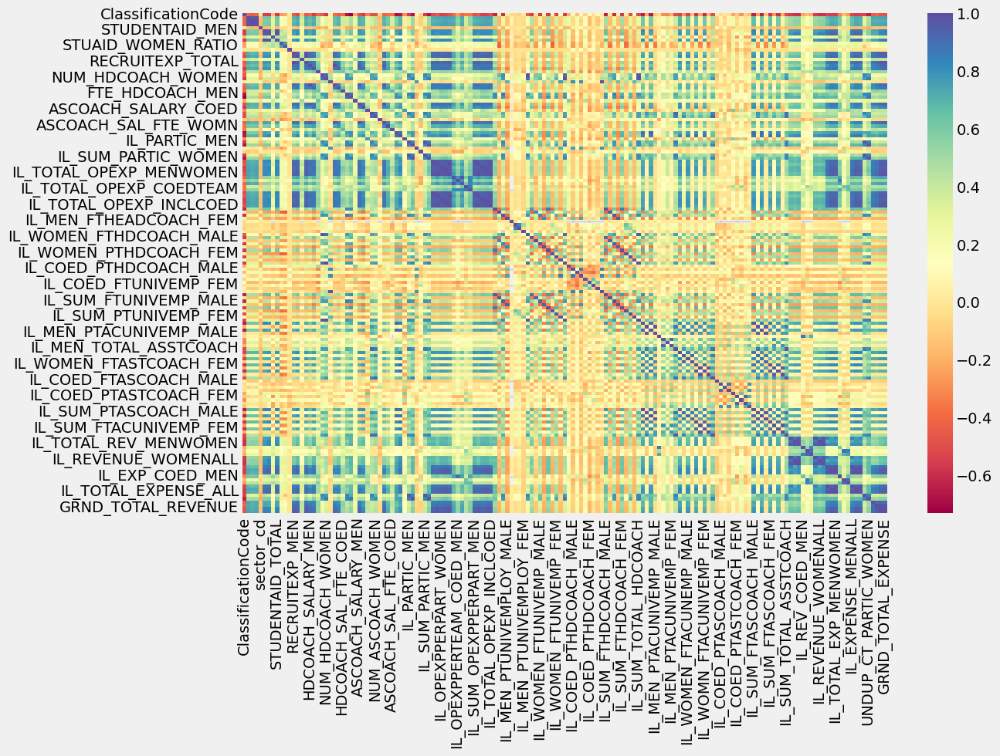

----------------------------------------------------------------------------------------------------
Histogram(s) & Boxplot(s):



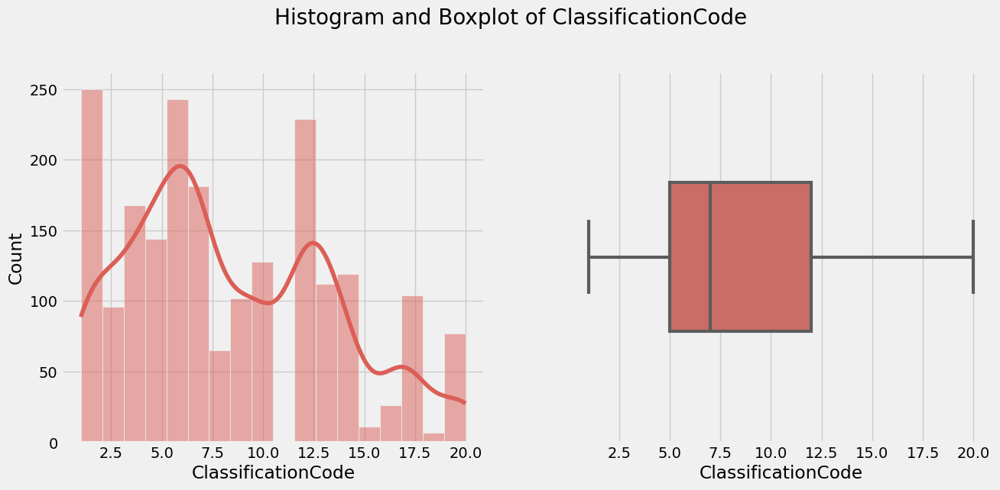

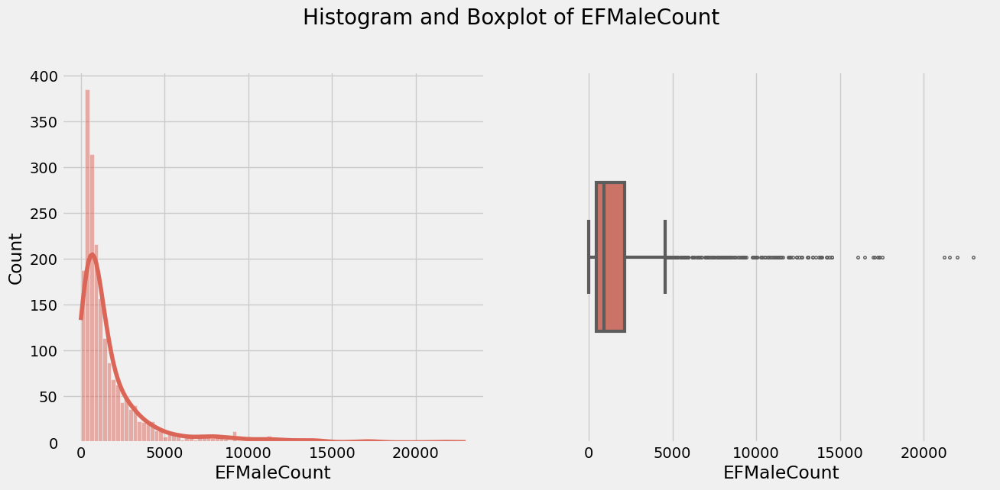

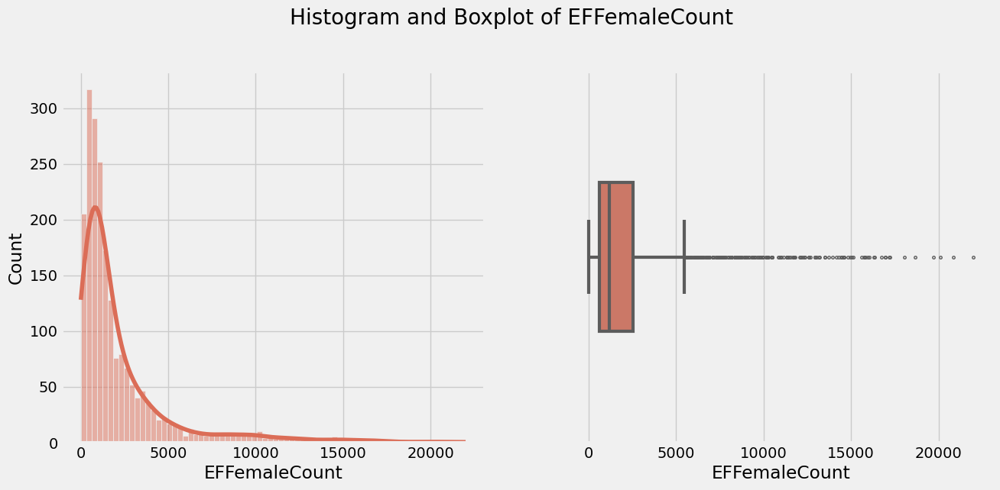

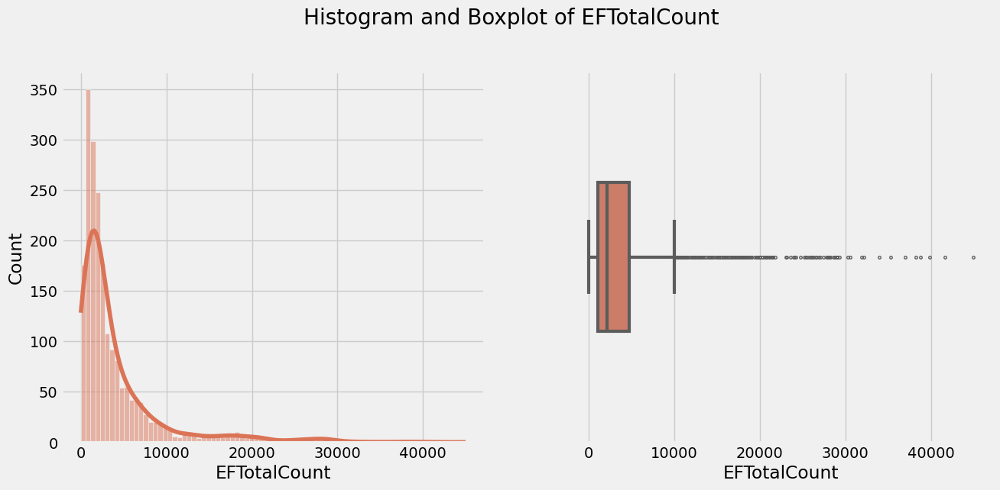

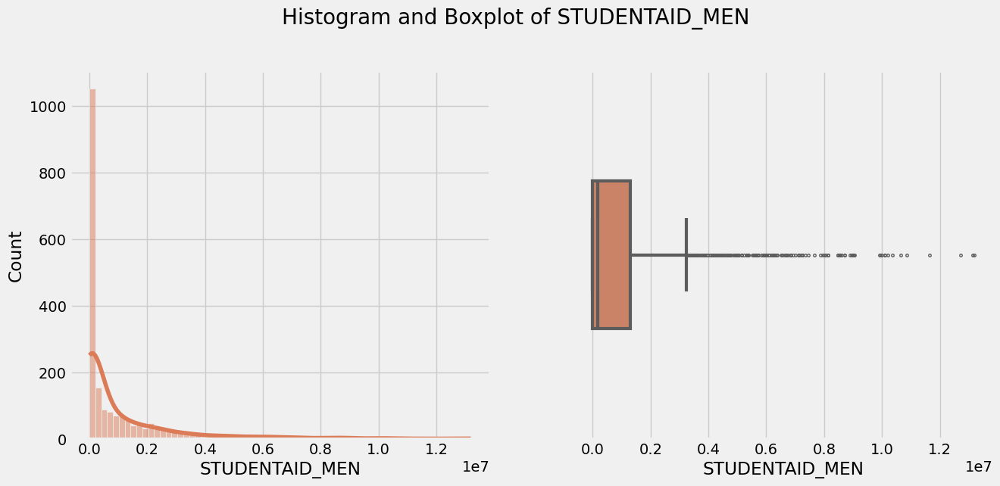

...

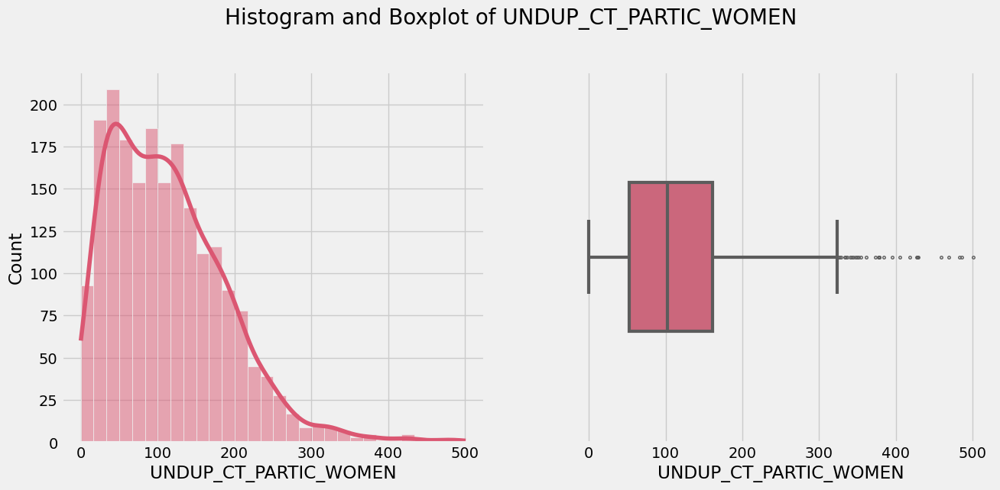

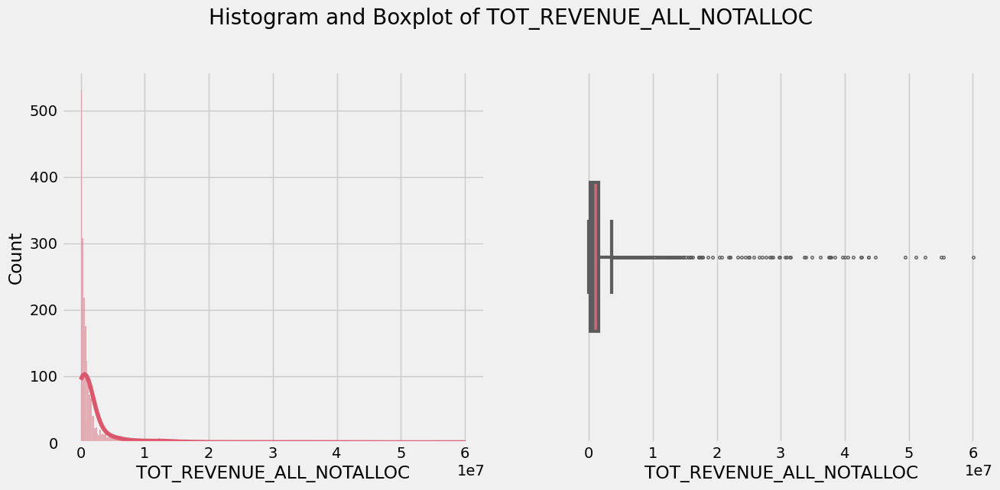

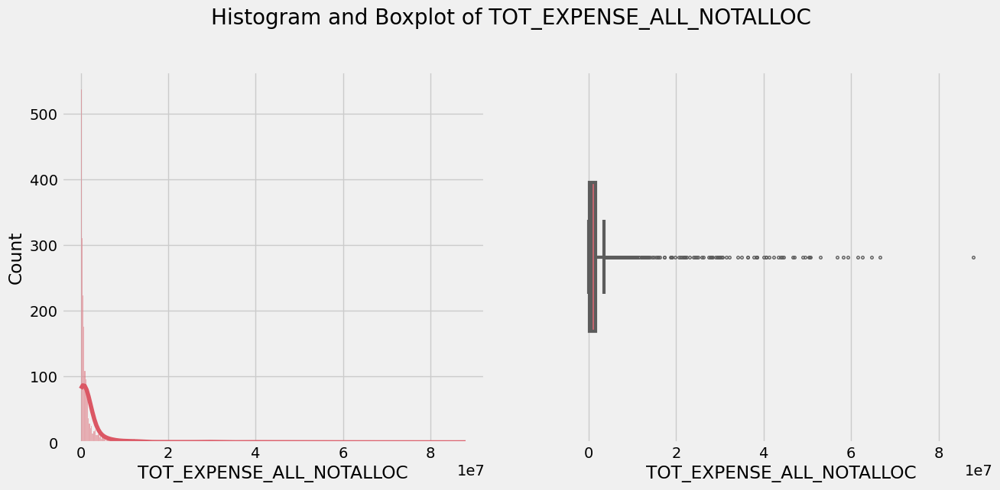

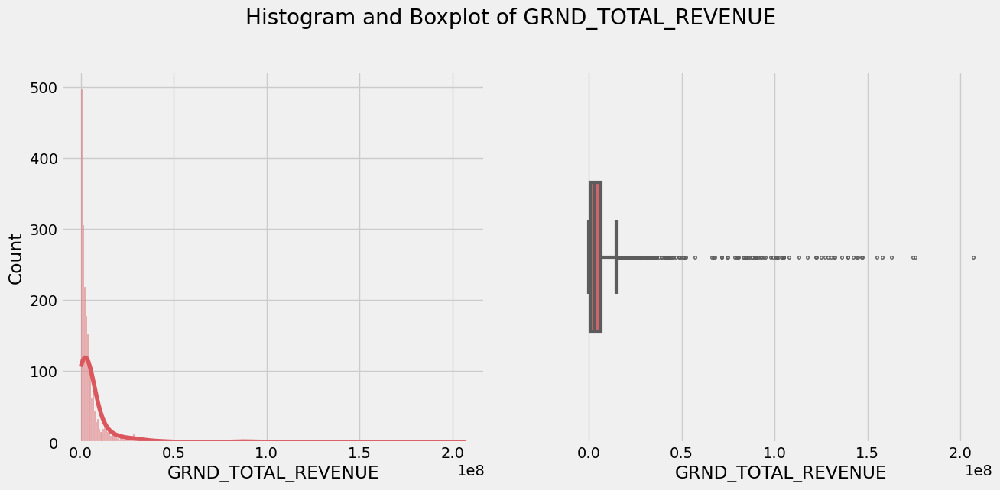

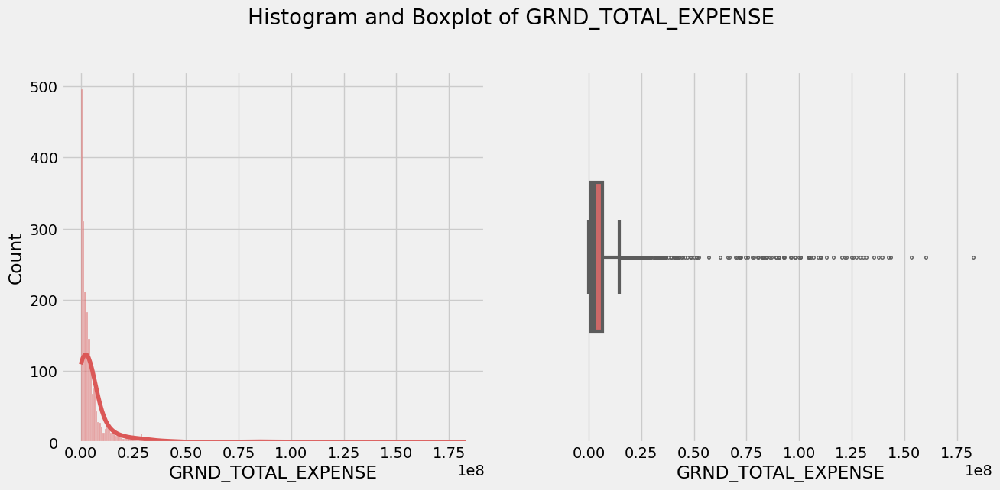

----------------------------------------------------------------------------------------------------
Countplot(s):



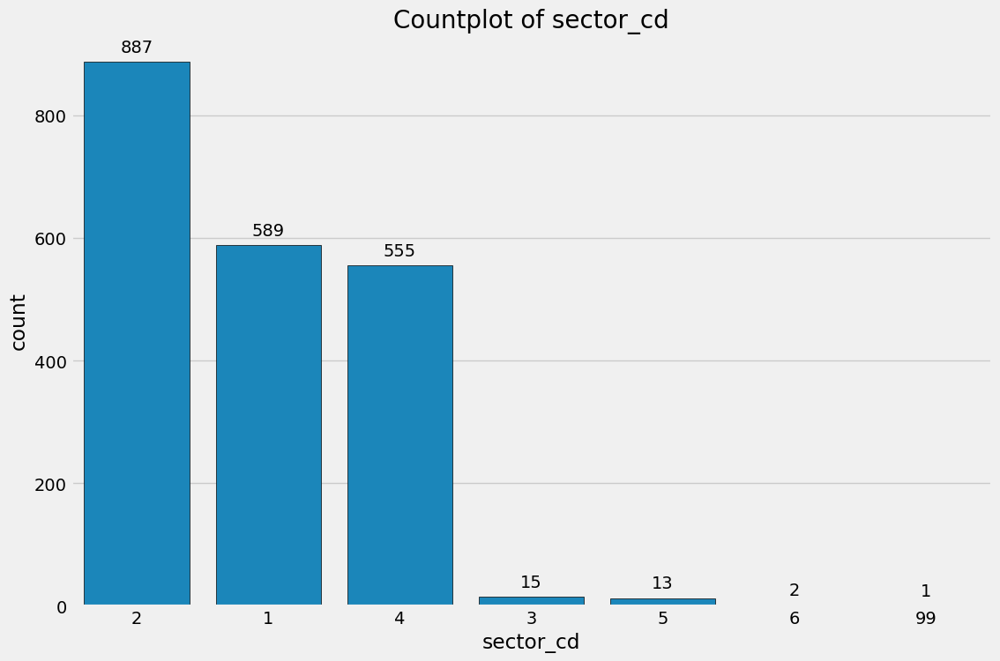

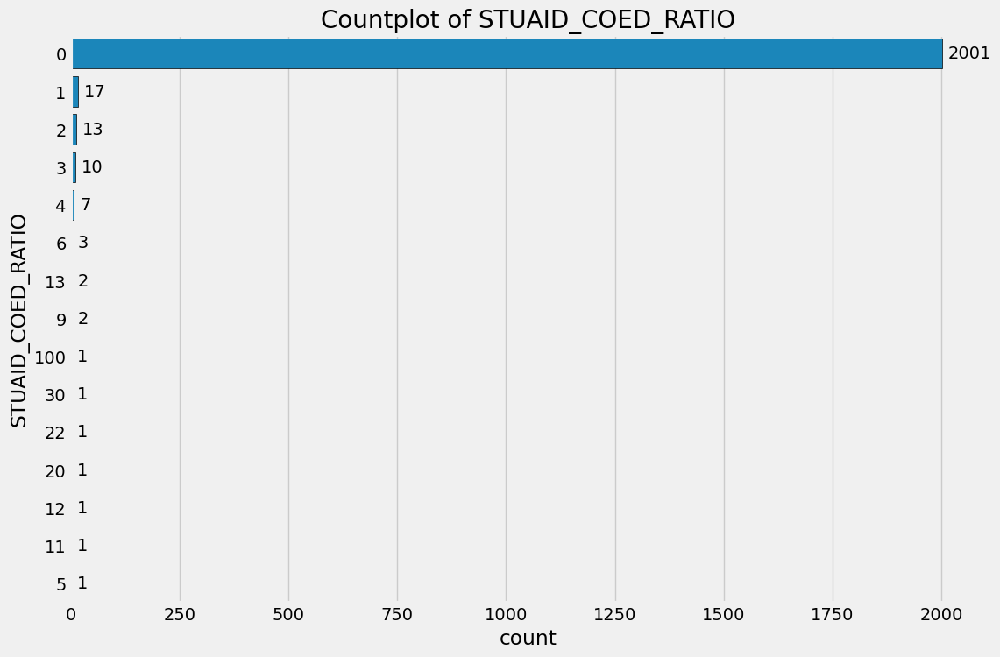

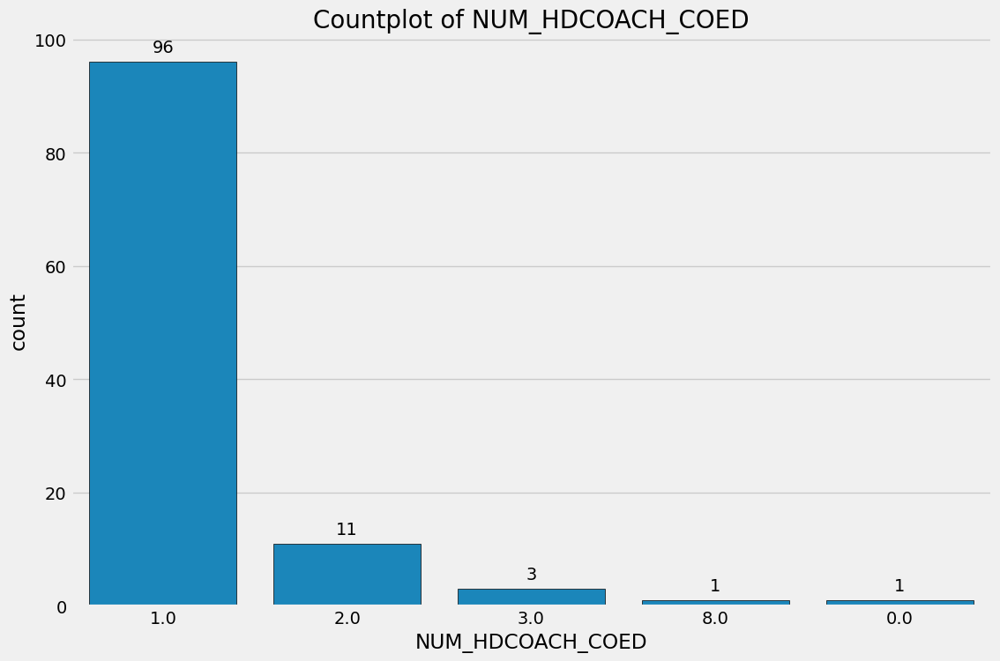

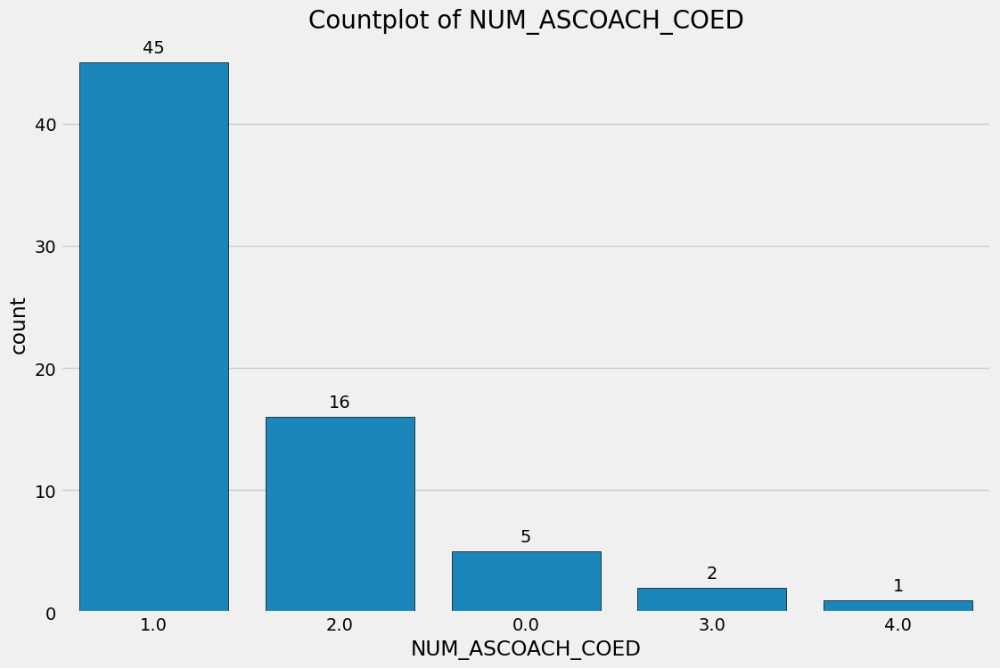

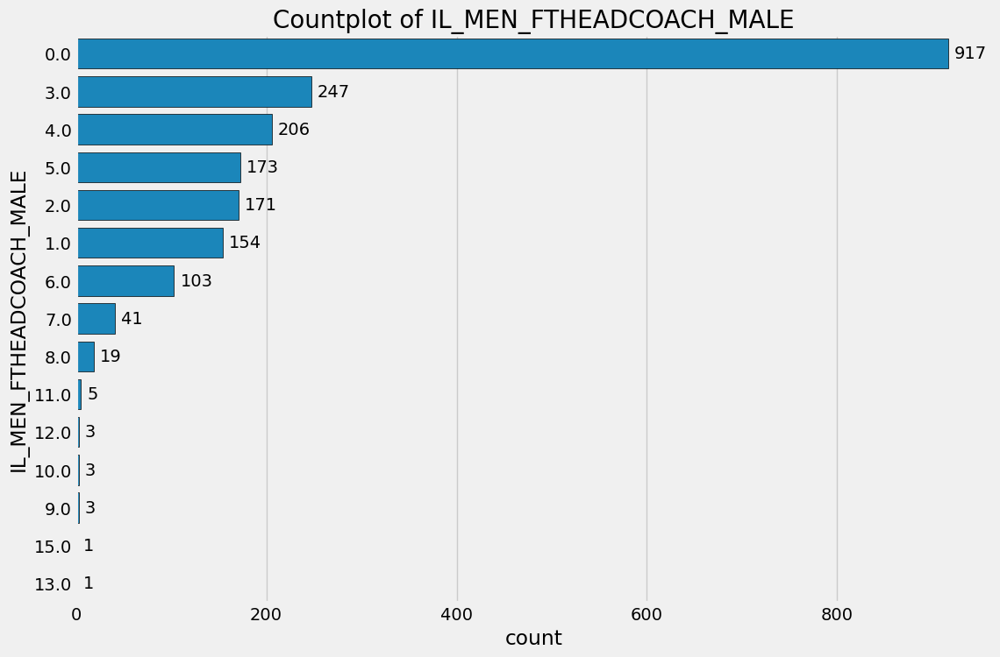

...

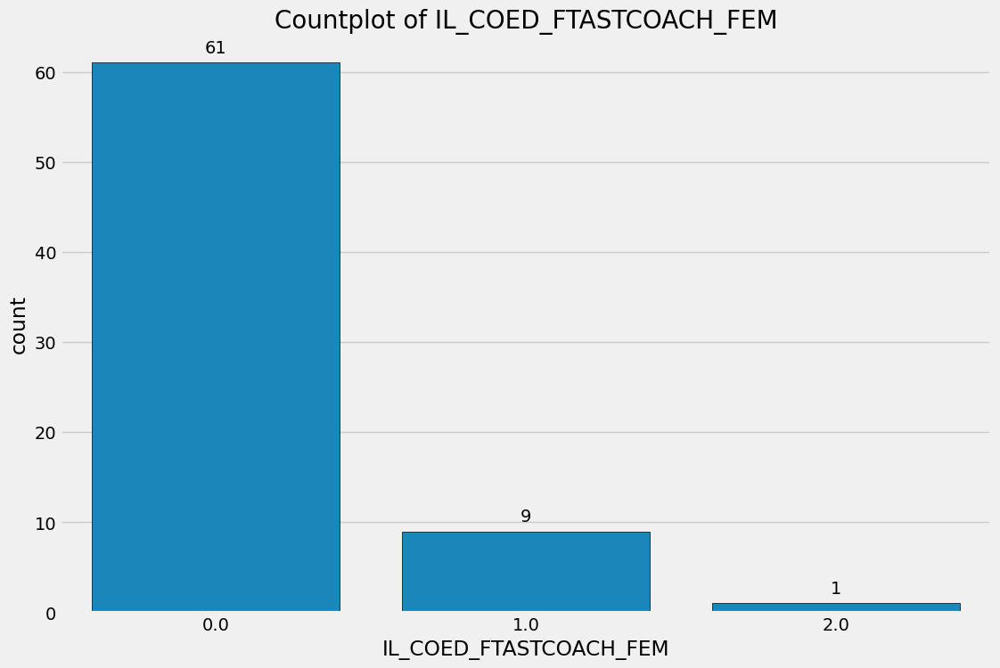

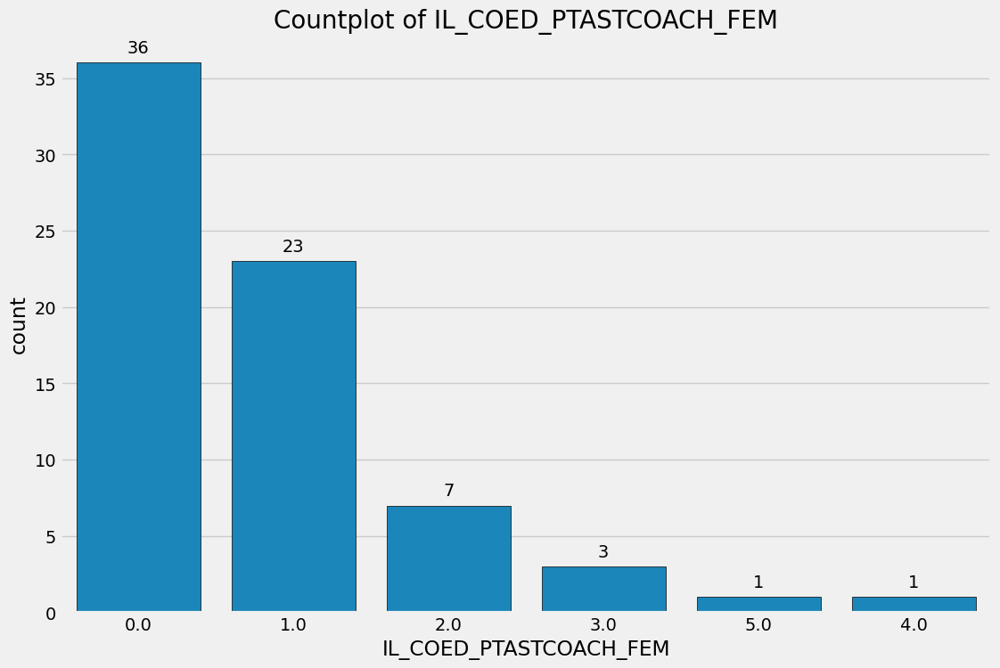

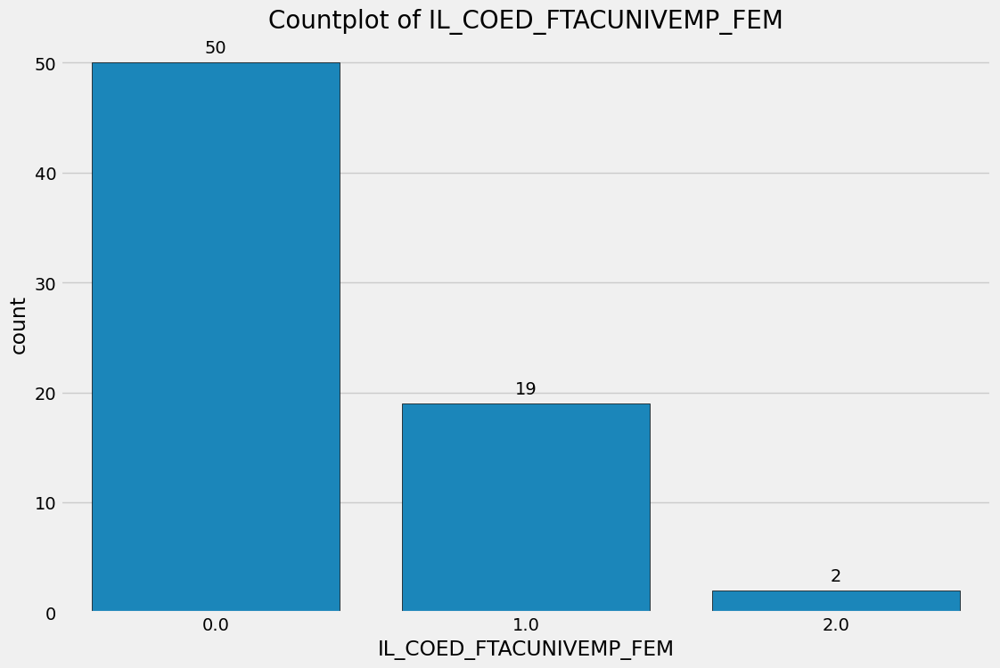

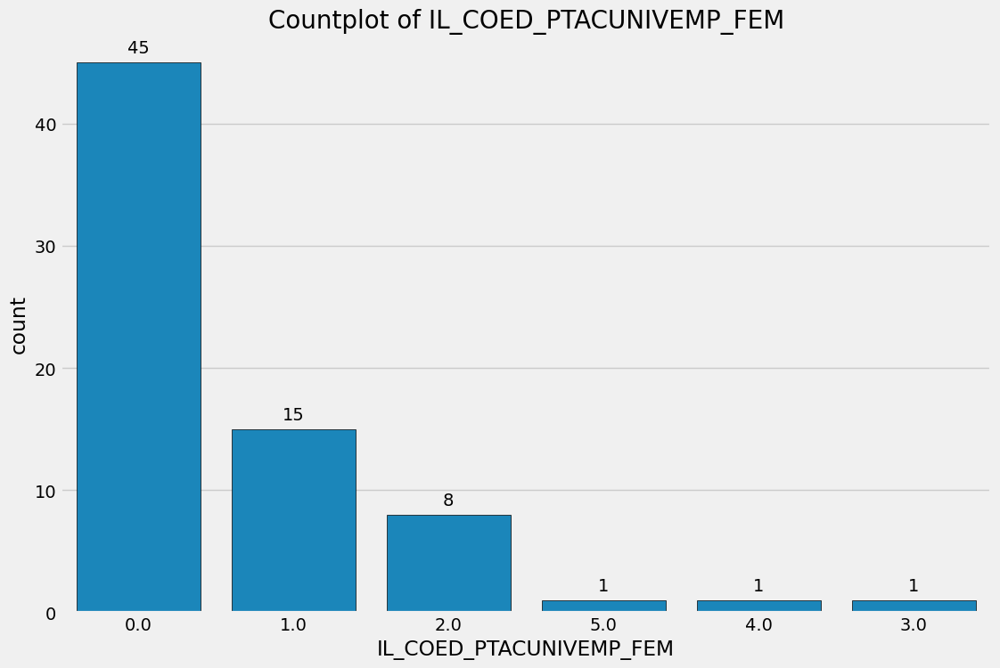

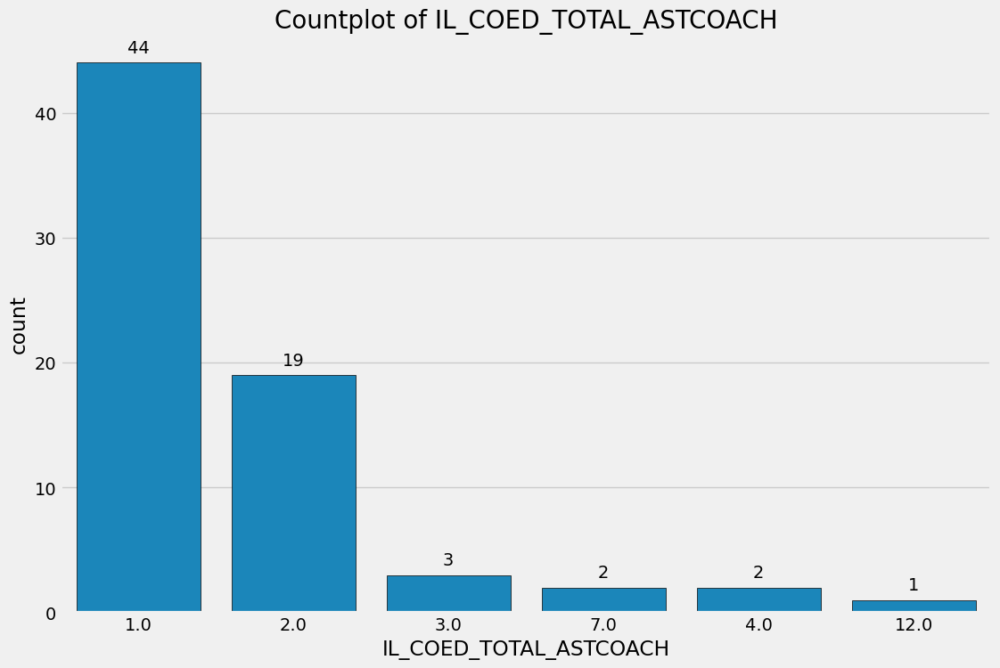

In [102]:
fast_eda(inst_level_numerical)

### Institution Level Data Unsupervised Analysis

#### Kmeans

In [168]:
# remove non numerical columns
non_num_cols = ['unitid',  'addr1_txt', 'addr2_txt', 'city_txt',
       'state_cd', 'zip_text', 'classification_name',  'ClassificationOther',
                'sector_name']

In [170]:
inst_level_numerical = inst_level.drop(non_num_cols, axis = 1)

In [324]:
#inst_level_numerical.shape

In [174]:
# remove columns with coed distinction as many are NA
addl_cols_to_drop = inst_level_numerical.filter(like = 'COED', axis = 1).columns

In [176]:
inst_level_numerical_no_coed = inst_level_numerical.drop(addl_cols_to_drop, axis = 1)

In [326]:
#inst_level_numerical_no_coed.shape

In [180]:
# drop NA values
inst_level_numerical_no_coed_no_na = inst_level_numerical_no_coed.dropna(axis = 0)

In [182]:
# understand shape of dataset after dropping
inst_level_numerical_no_coed_no_na.shape

(1916, 115)

In [184]:
# save institution name for merging later
institution_names = inst_level_numerical_no_coed_no_na['institution_name']

In [186]:
# remove institution name for clustering
inst_level_numerical_no_coed_no_na_no_name = inst_level_numerical_no_coed_no_na.drop('institution_name', axis = 1)

In [469]:
inst_level_numerical_no_coed_no_na_no_name.filter(like = 'TOTAL', axis = 1).columns

Index(['STUDENTAID_TOTAL', 'RECRUITEXP_TOTAL', 'IL_TOTAL_OPEXP_MENWOMEN',
       'IL_MEN_TOTAL_HEADCOACH', 'IL_WOMEN_TOTAL_HDCOACH',
       'IL_SUM_TOTAL_HDCOACH', 'IL_MEN_TOTAL_ASSTCOACH',
       'IL_WOMEN_TOTAL_ASTCOACH', 'IL_SUM_TOTAL_ASSTCOACH',
       'IL_TOTAL_REV_MENWOMEN', 'IL_TOTAL_REVENUE_ALL',
       'IL_TOTAL_EXP_MENWOMEN', 'IL_TOTAL_EXPENSE_ALL', 'GRND_TOTAL_REVENUE',
       'GRND_TOTAL_EXPENSE'],
      dtype='object')

In [ ]:
['EFTotalCount', 'STUDENTAID_TOTAL', 'RECRUITEXP_TOTAL', 'IL_SUM_PARTIC_MEN', 'IL_SUM_PARTIC_WOMEN',
 'IL_TOTAL_OPEXP_MENWOMEN',
       'IL_MEN_TOTAL_HEADCOACH', 'IL_WOMEN_TOTAL_HDCOACH',
       'IL_SUM_TOTAL_HDCOACH', 'IL_MEN_TOTAL_ASSTCOACH',
       'IL_WOMEN_TOTAL_ASTCOACH', 'IL_SUM_TOTAL_ASSTCOACH',
       'IL_TOTAL_REV_MENWOMEN', 'IL_TOTAL_REVENUE_ALL',
       'IL_TOTAL_EXP_MENWOMEN', 'IL_TOTAL_EXPENSE_ALL', 'GRND_TOTAL_REVENUE',
       'GRND_TOTAL_EXPENSE']

In [188]:
# scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(inst_level_numerical_no_coed_no_na_no_name)

In [190]:
# kmeans clustering
kmeans = KMeans(n_clusters=5, random_state=23)
labels = kmeans.fit_predict(X_scaled)

C:\Users\bridg\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(


In [192]:
# add labels back
inst_level_numerical_no_coed_no_na_no_name['cluster'] = labels
#print(inst_level_numerical_no_coed_no_na_no_name.head())

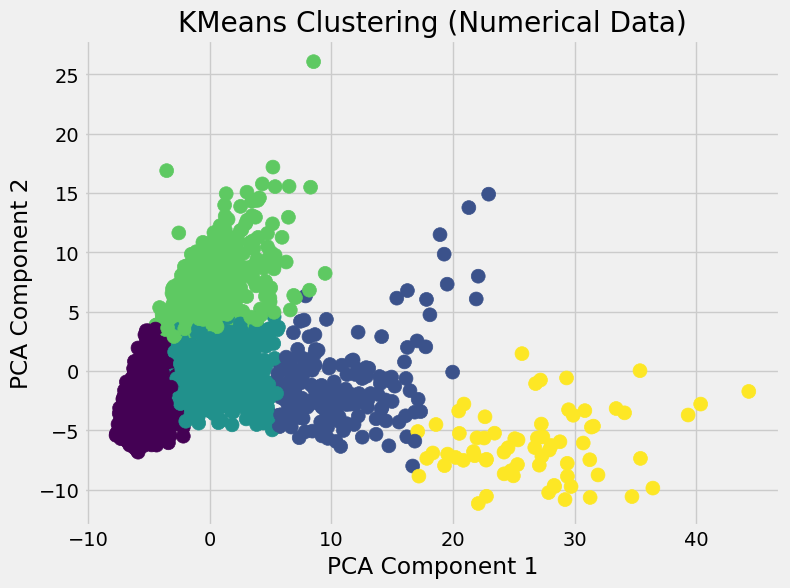

In [194]:
# visualize using PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', s=100)
plt.title("KMeans Clustering (Numerical Data)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.grid(True)
plt.show()

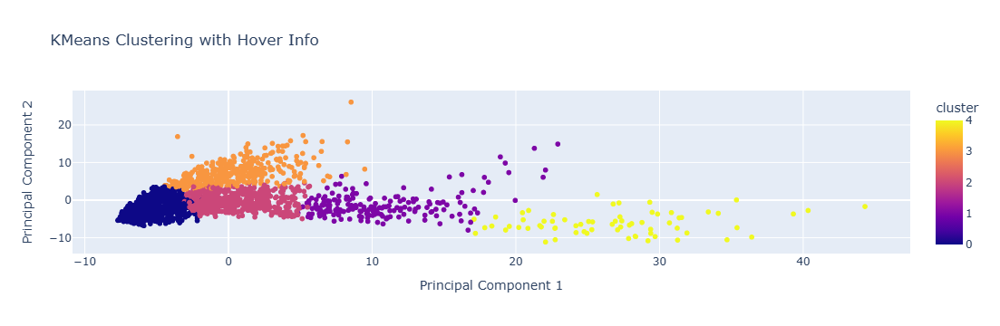

In [204]:
# Add results to dataframe
inst_level_numerical_no_coed_no_na_no_name['PC1'] = X_pca[:, 0]
inst_level_numerical_no_coed_no_na_no_name['PC2'] = X_pca[:, 1]
#inst_level_numerical_no_coed_no_na_no_name['cluster'] = clusters

inst_level_numerical_no_coed_no_na_no_name['university'] = institution_names

# Interactive plot
fig = px.scatter(
    inst_level_numerical_no_coed_no_na_no_name,
    x='PC1',
    y='PC2',
    color='cluster',
    hover_name='university',
    title='KMeans Clustering with Hover Info',
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2'}
)

fig.show()

In [208]:
from sklearn.neighbors import NearestNeighbors

In [214]:
# Nearest Neighbors (using scaled data)
nn = NearestNeighbors(n_neighbors=6).fit(X_scaled)  # 6 because the first is the point itself

In [290]:
# Function to find and plot nearest neighbors
def plot_neighbors(target_univ):
    if target_univ not in inst_level_numerical_no_coed_no_na_no_name['university'].values:
        print(f"{target_univ} not found.")
        return

    # Get index of university
    idx = inst_level_numerical_no_coed_no_na_no_name[inst_level_numerical_no_coed_no_na_no_name['university'] == target_univ].index[0]

    # Find 5 nearest neighbors
    distances, indices = nn.kneighbors([X_scaled[idx]])
    neighbor_indices = indices[0][1:]  # Exclude self

    # Mark selection
    inst_level_numerical_no_coed_no_na_no_name['highlight'] = 'Other'
    inst_level_numerical_no_coed_no_na_no_name.loc[idx, 'highlight'] = 'Target University'
    inst_level_numerical_no_coed_no_na_no_name.loc[neighbor_indices, 'highlight'] = 'Nearest Neighbors'

    # Plot
    fig = px.scatter(inst_level_numerical_no_coed_no_na_no_name, x='PC1', y='PC2', color='highlight', hover_name='university',
                     color_discrete_map={
                         'Other': 'lightgray',
                         'Target University': 'red',
                         'Nearest Neighbors': 'blue'
                     },
                     title=f"Nearest Neighbors to {target_univ}")
    
    # Zoom into target + neighbors
    zoom_df = inst_level_numerical_no_coed_no_na_no_name.loc[[idx] + list(neighbor_indices)]
    x_range = [zoom_df['PC1'].min() - 1, zoom_df['PC1'].max() + 1]
    y_range = [zoom_df['PC2'].min() - 1, zoom_df['PC2'].max() + 1]

    fig.update_layout(xaxis_range=x_range, yaxis_range=y_range)
    fig.show()

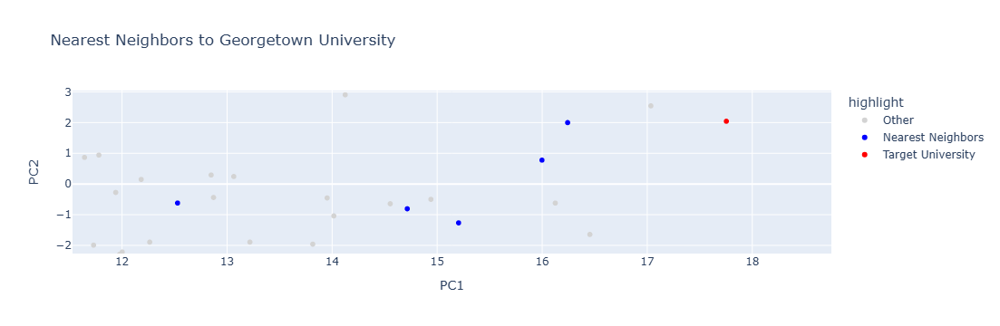

In [333]:
# Example usage
plot_neighbors("Georgetown University")

In [158]:
# Create a DataFrame of the component loadings
loadings = pd.DataFrame(
    pca.components_.T,  # transpose so each column is a PC
    columns=['PC1', 'PC2'],
    index=inst_level_numerical_no_coed_no_na.iloc[:, 0:114].columns
)

print("PCA Loadings:")
print(loadings)

PCA Loadings:
                               PC1       PC2
ClassificationCode       -0.092059 -0.022968
EFMaleCount               0.098661 -0.040304
EFFemaleCount             0.097254 -0.040585
EFTotalCount              0.098887 -0.040845
sector_cd                -0.028529 -0.013928
...                            ...       ...
UNDUP_CT_PARTIC_WOMEN     0.108850  0.102891
TOT_REVENUE_ALL_NOTALLOC  0.111205 -0.050558
TOT_EXPENSE_ALL_NOTALLOC  0.111877 -0.053887
GRND_TOTAL_REVENUE        0.120356 -0.057342
GRND_TOTAL_EXPENSE        0.121738 -0.056964

[114 rows x 2 columns]


In [164]:
loadings.sort_values('PC2')

,PC1,PC2
STUAID_WOMEN_RATIO,0.028762,-0.106979
STUAID_MEN_RATIO,0.031896,-0.102479
ASCOACH_SALARY_WOMEN,0.111426,-0.085047
ASCOACH_SALARY_MEN,0.113689,-0.078330
HDCOACH_SALARY_MEN,0.107253,-0.069656
...,...,...
IL_WOMEN_PTASTCOACH_FEM,0.029232,0.177761
IL_SUM_PTASCOACH_MALE,0.041170,0.188112
IL_MEN_PTACUNIVEMP_MALE,0.017098,0.188892
IL_SUM_PTACUNIVEMP_MALE,0.020533,0.189181


#### DBSCAN

In [344]:
#set_seed(23)
agglomerative = AgglomerativeClustering(n_clusters = 5)
labels = agglomerative.fit_predict(X_scaled)

In [364]:
agg_cluster_data = pd.concat([pd.DataFrame(labels, columns = ['agg_cluster']), inst_level_numerical_no_coed_no_na_no_name], axis = 1)

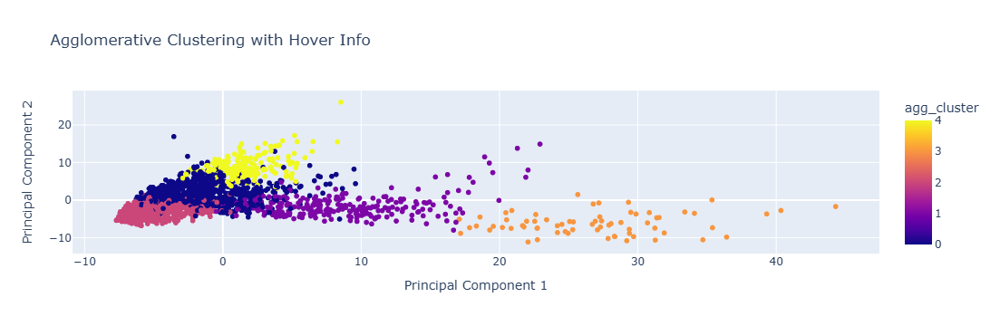

In [366]:
# Interactive plot
fig = px.scatter(
    agg_cluster_data,
    x='PC1',
    y='PC2',
    color='agg_cluster',
    hover_name='university',
    title='Agglomerative Clustering with Hover Info',
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2'}
)

fig.show()

### Sports Data

In [371]:
schools.Sports.unique()

array(['Baseball', 'Basketball', 'All Track Combined', 'Football', 'Golf',
       'Soccer', 'Softball', 'Tennis', 'Volleyball', 'Bowling', 'Rifle',
       'Beach Volleyball', 'Ice Hockey', 'Lacrosse', 'Gymnastics',
       'Rowing', 'Swimming and Diving', 'Track and Field, X-Country',
       'Equestrian', 'Wrestling', 'Track and Field, Indoor',
       'Track and Field, Outdoor', 'Other Sports', 'Rodeo', 'Skiing',
       'Swimming', 'Water Polo', 'Archery', 'Field Hockey', 'Fencing',
       'Sailing', 'Badminton', 'Diving', 'Squash',
       'Synchronized Swimming', 'Weight Lifting', 'Table Tennis'],
      dtype=object)

In [375]:
schools.columns

Index(['unitid', 'institution_name', 'addr1_txt', 'addr2_txt', 'city_txt',
       'state_cd', 'zip_text', 'ClassificationCode', 'classification_name',
       'ClassificationOther',
       ...
       'EXP_MEN', 'EXP_WOMEN', 'TOTAL_EXP_MENWOMEN', 'EXP_COED_MEN',
       'EXP_COED_WOMEN', 'TOTAL_EXP_COED', 'EXPENSE_MENALL',
       'EXPENSE_WOMENALL', 'TOTAL_EXPENSE_ALL', 'Sports'],
      dtype='object', length=128)

In [389]:
cols_to_drop = ['unitid', 'addr1_txt', 'addr2_txt', 'city_txt',
       'state_cd', 'zip_text',  'classification_name', 'ClassificationOther', 'sector_name']

schools_numerical = schools.drop(cols_to_drop, axis = 1)

In [391]:
addl_cols_to_drop = schools_numerical.filter(like = 'COED', axis = 1).columns

In [393]:
schools_numerical_no_coed = schools_numerical.drop(addl_cols_to_drop, axis = 1)

In [395]:
schools_numerical_no_coed.shape

(17414, 87)

In [401]:
import numpy as np

In [403]:
schools_numerical_no_coed_no_na = schools_numerical_no_coed.replace(np.nan, 0)

In [415]:
#fast_eda(schools_numerical_no_coed_no_na)
schools_numerical_no_coed_no_na

,institution_name,ClassificationCode,EFMaleCount,EFFemaleCount,EFTotalCount,sector_cd,SPORTSCODE,PARTIC_MEN,PARTIC_WOMEN,SUM_PARTIC_MEN,SUM_PARTIC_WOMEN,OPEXPPERPART_MEN,OPEXPPERTEAM_MEN,OPEXPPERPART_WOMEN,OPEXPPERTEAM_WOMEN,TOTAL_OPEXP_MENWOMEN,SUM_OPEXPPERPART_MEN,SUM_OPEXPPERTEAM_MEN,SUM_OPEXPPERPART_WOMEN,SUM_OPEXPPERTEAM_WOMEN,MEN_FTHEADCOACH_MALE,MEN_PTHEADCOACH_MALE,MEN_FTUNIVEMPLOY_MALE,MEN_PTUNIVEMPLOY_MALE,MEN_FTHEADCOACH_FEM,MEN_PTHEADCOACH_FEM,MEN_FTUNIVEMPLOY_FEM,MEN_PTUNIVEMPLOY_FEM,MEN_TOTAL_HEADCOACH,WOMEN_FTHDCOACH_MALE,WOMEN_PTHDCOACH_MALE,WOMEN_FTUNIVEMP_MALE,WOMEN_PTUNIVEMP_MALE,WOMEN_FTHDCOACH_FEM,WOMEN_PTHDCOACH_FEM,WOMEN_FTUNIVEMP_FEM,WOMEN_PTUNIVEMP_FEM,WOMEN_TOTAL_HDCOACH,SUM_FTHDCOACH_MALE,SUM_PTHDCOACH_MALE,SUM_FTUNIVEMP_MALE,SUM_PTUNIVEMP_MALE,SUM_FTHDCOACH_FEM,SUM_PTHDCOACH_FEM,SUM_FTUNIVEMP_FEM,SUM_PTUNIVEMP_FEM,SUM_TOTAL_HDCOACH,MEN_FTASCOACH_MALE,MEN_PTASCOACH_MALE,MEN_FTACUNIVEMP_MALE,MEN_PTACUNIVEMP_MALE,MEN_FTASSTCOACH_FEM,MEN_PTASSTCOACH_FEM,MEN_FTACUNIVEMP_FEM,MEN_PTACUNIVEMP_FEM,MEN_TOTAL_ASSTCOACH,WOMEN_FTASCOACH_MALE,WOMEN_PTASCOACH_MALE,WOMEN_FTACUNEMP_MALE,WOMEN_PTACUNEMP_MALE,WOMEN_FTASTCOACH_FEM,WOMEN_PTASTCOACH_FEM,WOMN_FTACUNIVEMP_FEM,WOMN_PTACUNIVEMP_FEM,WOMEN_TOTAL_ASTCOACH,SUM_FTASCOACH_MALE,SUM_PTASCOACH_MALE,SUM_FTACUNIVEMP_MALE,SUM_PTACUNIVEMP_MALE,SUM_FTASCOACH_FEM,SUM_PTASCOACH_FEM,SUM_FTACUNIVEMP_FEM,SUM_PTACUNIVEMP_FEM,SUM_TOTAL_ASSTCOACH,REV_MEN,REV_WOMEN,TOTAL_REV_MENWOMEN,REVENUE_MENALL,REVENUE_WOMENALL,TOTAL_REVENUE_ALL,EXP_MEN,EXP_WOMEN,TOTAL_EXP_MENWOMEN,EXPENSE_MENALL,EXPENSE_WOMENALL,TOTAL_EXPENSE_ALL,Sports
0,Alabama A & M University,2,1801,2410,4211,1,1,35.0,0.0,35,0,4443.0,155495.0,0.0,0.0,155495.0,4443,155495,0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,1,0,0,0,0,0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,1,0,0,0,0,0,1,516227.0,0.0,516227.0,516227,0,516227,516227.0,0.0,516227.0,516227,0,516227,Baseball
1,Alabama A & M University,2,1801,2410,4211,1,2,15.0,15.0,15,15,15111.0,226663.0,15096.0,226433.0,453096.0,15111,226663,15096,226433,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1,0,1,0,1,0,1,0,2,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,1.0,0.0,1.0,3.0,4,0,4,0,0,1,0,1,5,824939.0,869729.0,1694668.0,824939,869729,1694668,824939.0,869729.0,1694668.0,824939,869729,1694668,Basketball
2,Alabama A & M University,2,1801,2410,4211,1,3,53.0,73.0,53,73,986.0,52260.0,923.0,67353.0,119613.0,986,52260,923,67353,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0,0,0,0,0,2,2,0,2,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0,2,2,0,0,0,0,0,2,232691.0,366033.0,598724.0,232691,366033,598724,232691.0,366033.0,598724.0,232691,366033,598724,All Track Combined
3,Alabama A & M University,2,1801,2410,4211,1,7,108.0,0.0,108,0,5437.0,587221.0,0.0,0.0,587221.0,5437,587221,0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,1,0,0,0,0,0,1,8.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,0,8,0,0,0,0,0,8,2996306.0,0.0,2996306.0,2996306,0,2996306,2996306.0,0.0,2996306.0,2996306,0,2996306,Football
4,Alabama A & M University,2,1801,2410,4211,1,8,7.0,0.0,7,0,2980.0,20858.0,0.0,0.0,20858.0,2980,20858,0,0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,1,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,117942.0,0.0,117942.0,117942,0,117942,117942.0,0.0,117942.0,117942,0,117942,Golf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17409,Simon Fraser University,4,0,0,0,99,15,26.0,21.0,26,21,5287.0,137453.0,3355.

In [475]:
def plot_clusters_by_sport(sport):

    data = schools_numerical_no_coed_no_na[schools_numerical_no_coed_no_na['Sports'] == sport]

    institutions = data['institution_name']

    data_dropped = data.drop(['institution_name', 'Sports'], axis = 1)

    # scale the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(data_dropped)

    # visualize using PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    # Add results to dataframe
    data_dropped['PC1'] = X_pca[:, 0]
    data_dropped['PC2'] = X_pca[:, 1]
    data_dropped['university'] = institutions


    # Interactive plot
    fig = px.scatter(
        data_dropped,
        x='PC1',
        y='PC2',
        hover_name='university',
        title= sport + ' Principal Components',
        labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2'}
    )
    
    fig.show()

In [477]:
plot_clusters_by_sport('Basketball')

KeyError: 'Sports'

In [461]:
# Rename columns to prepare for wide_to_long (it expects consistent suffixes)
schools_numerical_no_coed_no_na.columns = [col.lower() for col in schools_numerical_no_coed_no_na.columns]  # optional cleanup
schools_numerical_no_coed_no_na.columns = schools_numerical_no_coed_no_na.columns.str.replace('_women', '.women')
schools_numerical_no_coed_no_na.columns = schools_numerical_no_coed_no_na.columns.str.replace('_men', '.men')

In [465]:
df_long = pd.wide_to_long(schools_numerical_no_coed_no_na,
                          stubnames=['exp', 'rev'],
                          i=['institution_name', 'Sports'],
                          j='gender',
                          sep='.',
                          suffix='(men|women)').reset_index()

KeyError: "['Sports'] not in index"